# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [71]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
#only if you have jupyterthemes
from jupyterthemes import jtplot
jtplot.style()

### Download Cifar10 dataset

In [72]:
torch.cuda.is_available()

False

In [73]:
DATA_PATH = 'cifar_data'
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

In [74]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: cifar_data
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [75]:
train_loader.batch_size

64

In [76]:
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[ 2.0607e+00,  1.9972e+00,  1.9972e+00,  ...,  1.9972e+00,
            1.9972e+00,  1.9972e+00],
          [ 2.0607e+00,  2.0449e+00,  2.0607e+00,  ...,  2.0607e+00,
            2.0607e+00,  2.0607e+00],
          [ 2.0607e+00,  2.0290e+00,  2.0449e+00,  ...,  2.0290e+00,
            2.0449e+00,  2.0449e+00],
          ...,
          [ 2.0607e+00,  1.7591e+00,  1.2193e+00,  ...,  1.8861e+00,
            1.9813e+00,  2.0290e+00],
          [ 2.0607e+00,  1.9020e+00,  1.5685e+00,  ...,  2.0290e+00,
            2.0290e+00,  2.0449e+00],
          [ 2.0607e+00,  1.9813e+00,  1.9020e+00,  ...,  2.0449e+00,
            2.0449e+00,  2.0449e+00]],

         [[ 2.1317e+00,  2.0671e+00,  2.0671e+00,  ...,  2.0671e+00,
            2.0671e+00,  2.0671e+00],
          [ 2.1317e+00,  2.1155e+00,  2.1317e+00,  ...,  2.1317e+00,
            2.1317e+00,  2.1317e+00],
          [ 2.1317e+00,  2.0994e+00,  2.1155e+00,  ...,  2.0994e+00,
            2.1155e+00,  2.1155e+00],
          ...,
     

### Using  GPUs

In [77]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cpu


### Mostrar imágenes

La imagen muestreada representa un: truck


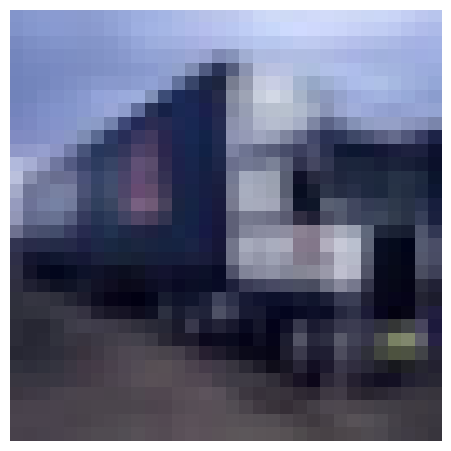

In [ ]:
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'The image is a: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


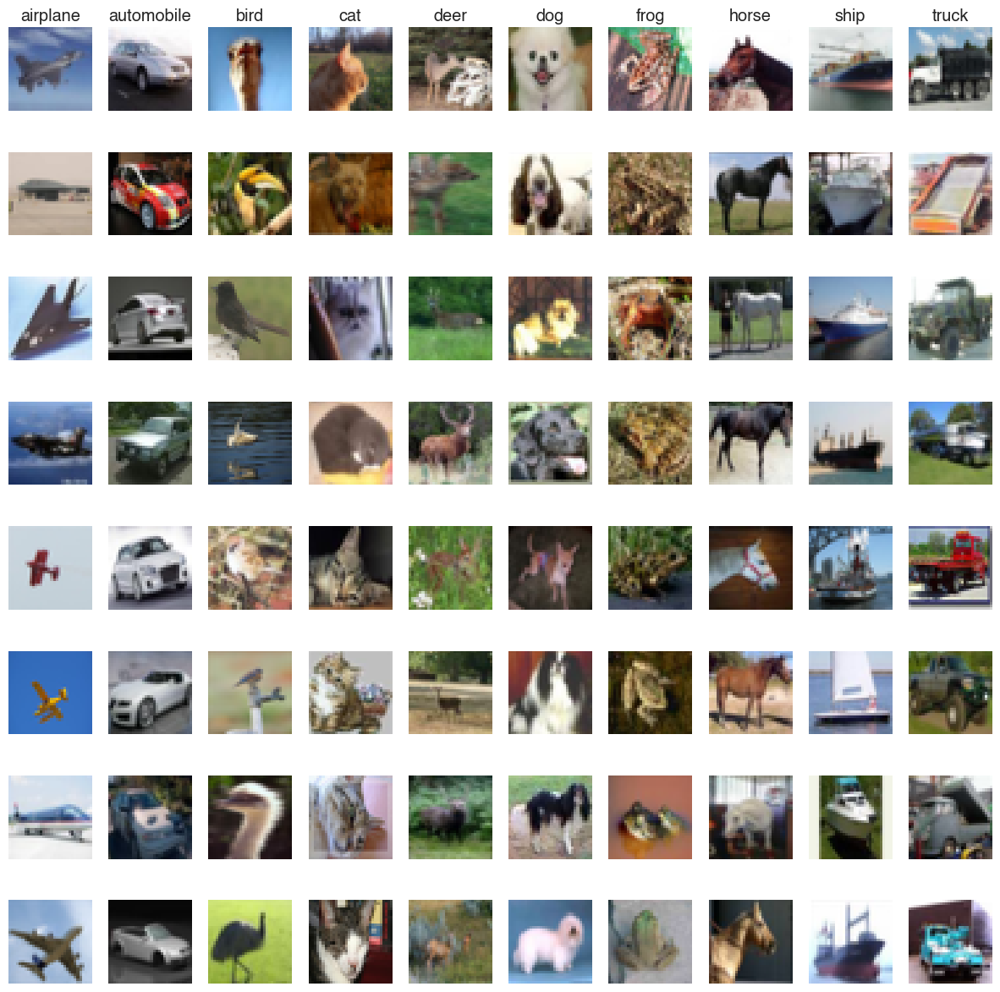

In [79]:
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calcular accuracy


For the acuracy, we are going to be using mostly the same function as with the previous activities, which basically calculating the number of correctly guessed (predicted) images against the totality of the set.

In [80]:
def accuracy(model, loader):
    num_correct = 0
    num_total = 0
    model.eval()
    model = model.to(device)
    
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = outputs.max(dim=1)
            num_correct += (preds == labels).sum().item()
            num_total += labels.size(0)
    
    return num_correct / num_total


### Loop de entrenamiento

The training loop will follow a similar strategy as the previous activities. We'll be showing the training and validation accuracy per each epoch, using a similat output format as the library Pytorch.

In [ ]:
def train(model, optimiser, train_loader, val_loader, epochs=100):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            optimiser.zero_grad()
            loss.backward()
            optimiser.step()
            
            running_loss += loss.item()
            _, preds = outputs.max(dim=1)
            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)
        
        train_acc = correct_train / total_train
        
        val_acc = accuracy(model, val_loader)

        print(f'Epoch {epoch}/{epochs} | Val Acc: {val_acc:.4f} | Train Acc: {train_acc:.4f}')

### Linear model

The liner model will also be pretty simple, accepting images of 32x32 pixels and an additional dimension, z, which represents the color channel. Remember that the color in the images will be represented and processed as RGB, hence the *3 operation in the input size. The final layer will be of size 10, representing the total number of classes we're classifying.

In [1]:
input_size = 32 * 32 * 3
num_classes = 10
lr = 1e-3

In [ ]:
# To do: Use PyTorch to create a linear model to have an initial baseline model
class LinearModel(nn.Module):
    def __init__(self, input_size, num_classes):
        super(LinearModel, self).__init__()
        self.fc = nn.Linear(input_size, num_classes)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return self.fc(x)


The weight decay that works kinda ok here is the same as the learning rate. But it can be a different value. Will leave it as a hardcoded parameter for now.

In [ ]:
# Initialize model, optimizer, and train
model1 = LinearModel(input_size, num_classes)
optimiser = torch.optim.Adam(model1.parameters(), lr=lr, weight_decay=1e-3)

In [84]:
train(model1, optimiser, train_loader, val_loader, epochs=20)

Epoch 0/20 | Train Loss: 1.9906 | Train Acc: 0.3386 | Val Acc: 0.3558
Epoch 1/20 | Train Loss: 1.9125 | Train Acc: 0.3604 | Val Acc: 0.3510
Epoch 2/20 | Train Loss: 1.8888 | Train Acc: 0.3692 | Val Acc: 0.3640
Epoch 3/20 | Train Loss: 1.8833 | Train Acc: 0.3722 | Val Acc: 0.3616
Epoch 4/20 | Train Loss: 1.8690 | Train Acc: 0.3786 | Val Acc: 0.3650
Epoch 5/20 | Train Loss: 1.8582 | Train Acc: 0.3814 | Val Acc: 0.3582
Epoch 6/20 | Train Loss: 1.8624 | Train Acc: 0.3819 | Val Acc: 0.3606
Epoch 7/20 | Train Loss: 1.8469 | Train Acc: 0.3836 | Val Acc: 0.3588
Epoch 8/20 | Train Loss: 1.8442 | Train Acc: 0.3865 | Val Acc: 0.3692
Epoch 9/20 | Train Loss: 1.8457 | Train Acc: 0.3880 | Val Acc: 0.3510
Epoch 10/20 | Train Loss: 1.8388 | Train Acc: 0.3891 | Val Acc: 0.3778
Epoch 11/20 | Train Loss: 1.8457 | Train Acc: 0.3870 | Val Acc: 0.3752
Epoch 12/20 | Train Loss: 1.8392 | Train Acc: 0.3903 | Val Acc: 0.3636
Epoch 13/20 | Train Loss: 1.8308 | Train Acc: 0.3900 | Val Acc: 0.3560
Epoch 14/20 | Tr

The model, using the most basic configurations, reach an accuracy of almost 40%. We'll not be trying to tune it down further, as the main objective of this activity is using the Pytorch classes to actually create a full-fledge model that exemplifies the advantages of the library.

### Sequential CNN

In [ ]:
# Create a CNN class using Pytorch classes. In this case, we'll be inheriting from the Module class to generate the CNN.
class CNNModel(nn.Module):
    def __init__(self, num_classes=10):
        """
        A simple CNN model using Pytorch.
        This model consists of a pretty standard architectural pattern:
            - 3 convolutional layers with ReLU activations and max pooling, extracting features from input images.
            - A fully connected (FC) layer followed by a dropout layer to reduce overfitting.
            - An output layer that maps the learned features to the 10 class labels of the CIFAR-10 dataset.
        """
        super(CNNModel, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # The layer flattens the 128 feature maps of size 4x4 into a
        # 2048-dimensional vector and then maps it to a 256-dimensional vector.
        self.fc_layers = nn.Sequential(
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)
        x = self.fc_layers(x)
        return x

Let's create the model! Will use a simple Adam optimizer, pretty standard and well known for this dataset.

In [106]:
modelCNN1 = CNNModel(num_classes=10).to(device)
optimiser = torch.optim.Adam(modelCNN1.parameters(), lr=1e-3, weight_decay=1e-4)

Our training will be only of 10 epochs, which is enough to get an accuracy above the mark that the activity asks for.

In [ ]:
train(modelCNN1, optimiser, train_loader, val_loader, epochs=10)

In [ ]:
test_acc = accuracy(modelCNN1, test_loader)
print(f'Test Accuracy: {test_acc:.4f}')

Test Accuracy: 0.7682


So, you can see that even with only 10 epochs and standard Adam optimizers without much tampering, we managed to get a pretty good accuracy of 76.82%. Enough for the purpose of this activity, as it exemplifies the usage of Pytorch to create a CNN.

In [89]:
def predict(image, model):
    model.eval()
    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        scores = model(image)
        _, pred = scores.max(dim=1)
    return pred.item()

Let's use it now! We'll test it to exemplify the 70% accuracy.

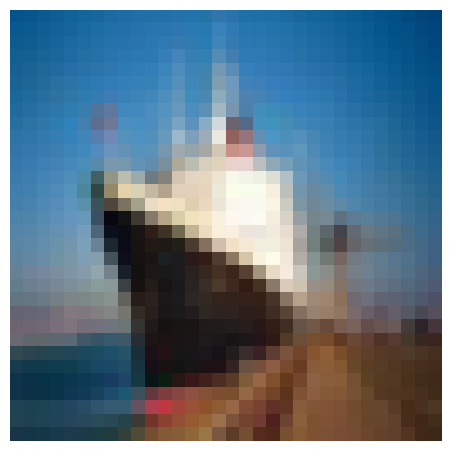

Predicted result was correct!

The original image is a: ship
The predicted image is a: ship


In [103]:
rnd_idx = np.random.randint(len(test_loader.dataset))
image, label = test_loader.dataset[rnd_idx]

image_display = (image - image.min()) / (image.max() - image.min())

plt.imshow(np.transpose(image_display.numpy(), (1, 2, 0)))
plt.axis('off')
plt.show()

predicted_class = predict(image, modelCNN1)

if (classes[label] == classes[predicted_class]):
  print("Predicted result was correct!", end="\n"*2)

print(f'The original image is a: {classes[label]}')
print(f'The predicted image is a: {classes[predicted_class]}')